# Project Results
By Karan Rawat and Shreyas Mayya
DS 3001

## Context: 

The Washington Wizards, an NBA team have hired us to found out the most efficent spots on the courts, so they can teach their young players the best spots to shoot from and practice shooting at those spots. 

## Prediction: 

Prediction Question: Which locations on a basketball court provide the highest expected value of points earned?

Prediction: The corners of the three point line will have the highest expected points. Then 0-3 feet shots and other 3-point shots will closely follow. Mid rangers (5 feet - 3-point line) will have the least points expected other then really far three point shots.

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns

def quarter_to_int(quarter):
    return int(quarter[0])

def time_remaining_to_seconds(time_remaining):
    minutes, seconds = time_remaining.split(":")
    return float(minutes) * 60 + float(seconds)

def total_time_remaining(quarter, time):
    return (4 - quarter) * 12 * 60 + time

def maxmin(z):
    z = (z-min(z))/(max(z)-min(z))
    return(z)

# Load the data

df = pd.DataFrame()

for file in os.listdir("../data_by_season"):
    if file.endswith(".csv"):
        df = pd.concat([df, pd.read_csv("../data_by_season/" + file)])

# Make quarter an integer
df["quarter"] = df["quarter"].apply(quarter_to_int)

# Make time_remaining a float
df["time_remaining"] = df["time_remaining"].apply(time_remaining_to_seconds)

# Create a total_time_remaining column representing time left in the game (not just the quarter)
df["total_time_remaining"] = df.apply(lambda x: total_time_remaining(x["quarter"], x["time_remaining"]), axis=1)

# Create two columns for shooting team score and opposing team score
df["shooting_team_score"] = df["score"].apply(lambda x: int(x.split("-")[0]))
df["opposing_team_score"] = df["score"].apply(lambda x: int(x.split("-")[1]))

# Create a column for score difference: shooting team score - opposing team score
df["score_difference"] = df["shooting_team_score"] - df["opposing_team_score"]

# Create a column for number of points scored on the play if made
df["points_max"] = df["shot_type"].apply(lambda x: int(x.split("-")[0]))

# Create a column for points actually scored on the play
df["points_actual"] = df.apply(lambda x: x["points_max"] if x["made"] else 0, axis=1)

# Sort the data by match_id and total_time_remaining (will put them in chronological order)
df = df.sort_values(["match_id", "total_time_remaining"], ascending=[True, False])

# Limit the data to shots in the square between (0, 0), (0, 50), (50, 0), and (50, 50) -- remove outliers/out of bounds
df = df[(df["shotX"] >= 0) & (df["shotX"] <= 50) & (df["shotY"] >= 0) & (df["shotY"] <= 50)]

df.head()

,match_id,shotX,shotY,quarter,time_remaining,player,team,made,shot_type,distance,score,opp,status,year,total_time_remaining,shooting_team_score,opposing_team_score,score_difference,points_max,points_actual
62,200010310ATL,31.7,6.5,1,707.0,Jim Jackson,ATL,False,2-pointer,8,0-0,'CHH',tied,2001,2867.0,0,0,0,2,0
63,200010310ATL,24.0,5.0,1,706.0,Hanno Möttölä,ATL,True,2-pointer,0,2-0,'CHH',leads,2001,2866.0,2,0,2,2,2
0,200010310ATL,8.3,20.2,1,689.0,Baron Davis,CHH,False,2-pointer,22,0-2,'CHH',trails,2001,2849.0,0,2,-2,2,0
64,200010310ATL,14.6,8.0,1,670.0,Alan Henderson,ATL,False,2-pointer,10,2-0,'CHH',leads,2001,2830.0,2,0,2,2,0
1,200010310ATL,35.9,15.8,1,641.0,Jamal Mashburn,CHH,False,2-pointer,16,0-2,'CHH',trails,2001,2801.0,0,2,-2,2,0


In [8]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

# Create a new dataframe with the relevant columns
df_model = df[["shotX", "shotY", "year", "points_actual"]]
df_model = df_model.dropna()

# Split the data into training and testing sets
X = df_model[["shotX", "shotY"]].apply(maxmin)
y = df_model["points_actual"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1738)

In [ ]:
# Use the elbow method to find the optimal number of neighbors
mse_list = []
for k in range(1, 101):
    knn = KNeighborsRegressor(n_neighbors=k, weights="distance", n_jobs=-1)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mse_list.append(mse)

Optimal k: 100


([<matplotlib.axis.XTick at 0x719e8657aae0>,
 [Text(0, 0, '0'),
  Text(5, 0, '5'),
  Text(10, 0, '10'),
  Text(15, 0, '15'),
  Text(20, 0, '20'),
  Text(25, 0, '25'),
  Text(30, 0, '30'),
  Text(35, 0, '35'),
  Text(40, 0, '40'),
  Text(45, 0, '45'),
  Text(50, 0, '50'),
  Text(55, 0, '55'),
  Text(60, 0, '60'),
  Text(65, 0, '65'),
  Text(70, 0, '70'),
  Text(75, 0, '75'),
  Text(80, 0, '80'),
  Text(85, 0, '85'),
  Text(90, 0, '90'),
  Text(95, 0, '95'),
  Text(100, 0, '100')])

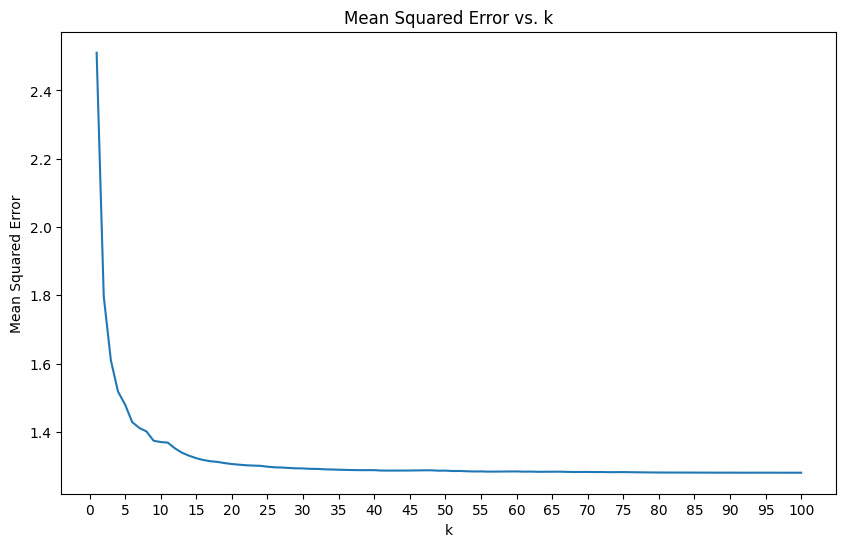

In [18]:
# Plot the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 101), mse_list)
plt.xlabel("k")
plt.ylabel("Mean Squared Error")
plt.title("Mean Squared Error vs. k")
plt.xticks(range(0, 101, 5))

Mean Squared Error: 1.5735464282788476


Text(0, 0.5, 'Shot Y Coordinate')

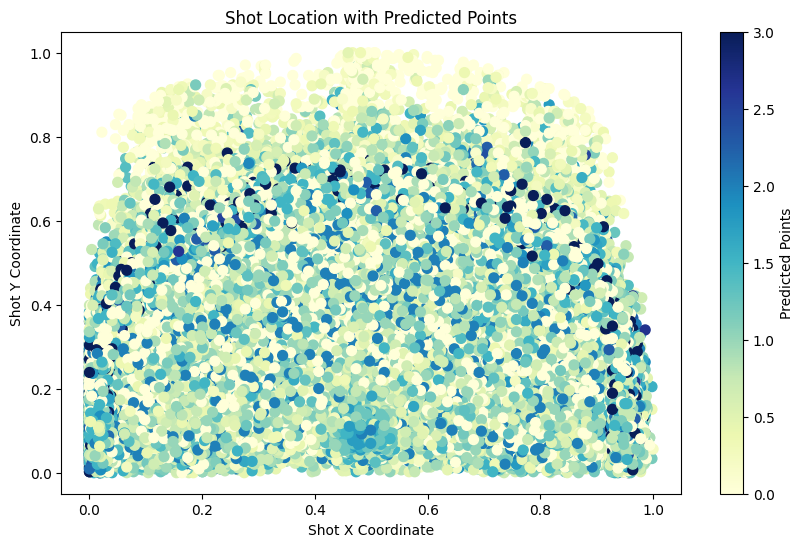

In [ ]:
# Elbow method indicates that the optimal k is around 8
optimal_k = 8
# Create the model with optimal k
knn = KNeighborsRegressor(n_neighbors=optimal_k, weights="distance", n_jobs=-1)
# Fit the model
knn.fit(X_train, y_train)
# Make predictions
y_pred = knn.predict(X_test)
# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# create new dataframe with x, y, sum of predictions, num of predictions
df2 = pd.DataFrame()


# Plot shotX and shotY with color representing y_pred
plt.figure(figsize=(10, 6))
plt.scatter(X_test["shotX"], X_test["shotY"], c=y_pred, cmap="YlGnBu", s=50)
plt.colorbar(label="Predicted Points")
plt.title("Shot Location with Predicted Points")
plt.xlabel("Shot X Coordinate")
plt.ylabel("Shot Y Coordinate")

This graph shows that the regions with the highest expected values of points earned are:

* Right around the basket (around $(0.5, 0)$) -- these shots are layups, where shooting accuracy is of little concern due to how close the player is to the basket.
* Along the three-point line (from $(0, 0)$ to about $(0, 0.32)$, then making an arc that peaks around $(0.5, 0.64)$ and curves back to $(1, 0.32)$ before continuing straight down to $(1, 0)$) -- any successful shot on or behind the three-point line can score three points, as opposed to two points for shots inside the three-point line, so shooting along the line allows the player to get as close as possible to the net while still earning the extra point for successful shots.

The mid-range (the area contained by the three-point line and $y = 0$) generally has a lower expected value associated with it. The lowest expected value comes from far behind the three point line, where the expected value is close to zero -- these shots are likely deep-3 shots with a low probability of success.

This information is useful, but doesn't account for the fact that play styles have changed over the years in the NBA. Can we adjust our model to include the season, emphasizing the influence of shots taken chronologically close to the one we're predicting?

In [20]:
# Split the data into training and testing sets
X = df_model[["shotX", "shotY", "year"]].apply(maxmin)
y = df_model["points_actual"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1738)

Mean Squared Error: 1.5735464282788476


Text(0, 0.5, 'Shot Y Coordinate')

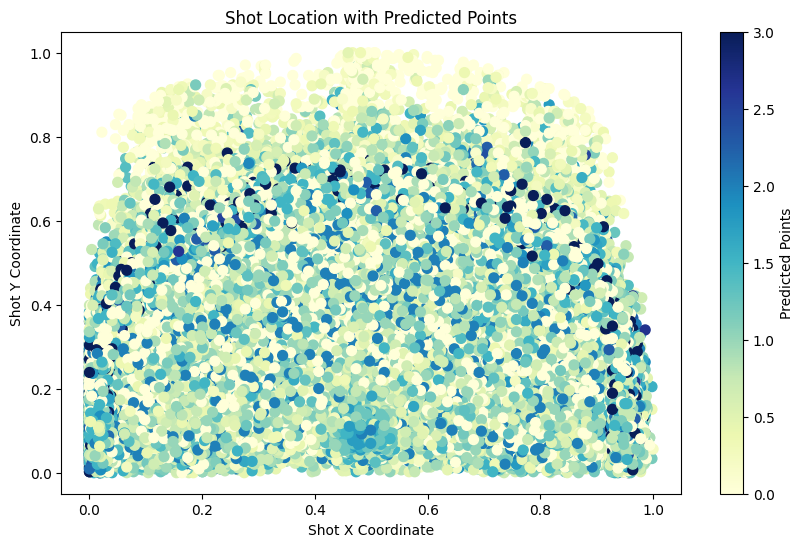

In [21]:
# Create the model with optimal k
knn = KNeighborsRegressor(n_neighbors=optimal_k, weights="distance", n_jobs=-1)
# Fit the model
knn.fit(X_train, y_train)
# Make predictions
y_pred = knn.predict(X_test)
# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Plot shotX and shotY with color representing y_pred
plt.figure(figsize=(10, 6))
plt.scatter(X_test["shotX"], X_test["shotY"], c=y_pred, cmap="YlGnBu", s=50)
plt.colorbar(label="Predicted Points")
plt.title("Shot Location with Predicted Points")
plt.xlabel("Shot X Coordinate")
plt.ylabel("Shot Y Coordinate")

We find that including the season as a variable (to add more influence to shots taken around the same time as the one being predicted) does not have a significant impact on our findings. The highest expected value of points earned can still be found immediately around the basket and along the three-point line, while mid-range shots and deep-3 shots are not as effective. We speculate that changing offensive play styles may be balanced out by corresponding changes in defensive play, resulting in a distribution that is relatively stable across the years.

Here are some additional charts showing season-specific prediction model results:

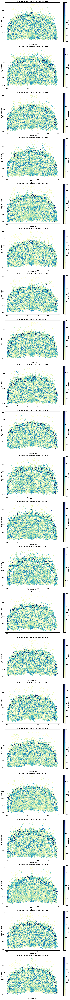

Highest Expected Points:
           shotX     shotY      year  predicted_points
177303  0.775551  0.504505  0.619048               3.0
148194  0.182365  0.630631  0.095238               3.0
165666  0.931864  0.218468  0.714286               3.0
62043   0.941884  0.193694  0.190476               3.0
53631   0.276553  0.619369  0.238095               3.0

Lowest Expected Points:
           shotX     shotY      year  predicted_points
149704  0.270541  0.646396  0.333333               0.0
131902  0.809619  0.094595  0.285714               0.0
92375   0.605210  0.657658  0.476190               0.0
188348  0.575150  0.441441  0.809524               0.0
206387  0.078156  0.306306  0.380952               0.0

Average Points for Certain Spots on the Court:
   rounded_shotX  rounded_shotY  predicted_points
0            0.0            0.0          1.092918
1            0.0            1.0          0.987078
2            1.0            0.0          0.914106
3            1.0            1.0          0

In [22]:
# Plot shotX and shotY with color representing y_pred for each year in separate graphs
unique_years = X_test["year"].unique()
fig, axes = plt.subplots(nrows=len(unique_years), ncols=1, figsize=(10, len(unique_years) * 6))

for i, year in enumerate(unique_years):
    ax = axes if len(unique_years) == 1 else axes[i]
    year_data = X_test[X_test["year"] == year]
    year_pred = y_pred[X_test["year"] == year]
    scatter = ax.scatter(year_data["shotX"], year_data["shotY"], c=year_pred, cmap="YlGnBu", s=50)
    ax.set_title(f"Shot Location with Predicted Points for Year {str(int(year * 21 + 2001))}")
    ax.set_xlabel("Shot X Coordinate")
    ax.set_ylabel("Shot Y Coordinate")
    fig.colorbar(scatter, ax=ax).set_label("Predicted Points")

plt.tight_layout()
plt.show()

# Create a table of the highest and lowest expected points
results_df = pd.DataFrame({'shotX': X_test['shotX'], 'shotY': X_test['shotY'], 'year': X_test['year'], 'predicted_points': y_pred})
highest_points = results_df.nlargest(5, 'predicted_points')
lowest_points = results_df.nsmallest(5, 'predicted_points')

print("Highest Expected Points:")
print(highest_points)

print("\nLowest Expected Points:")
print(lowest_points)

# Calculate average points for certain spots on the court (e.g., shotX and shotY rounded to nearest integer)
results_df['rounded_shotX'] = results_df['shotX'].round()
results_df['rounded_shotY'] = results_df['shotY'].round()
average_points = results_df.groupby(['rounded_shotX', 'rounded_shotY'])['predicted_points'].mean().reset_index()

print("\nAverage Points for Certain Spots on the Court:")
print(average_points)


## Criticisms 

This data does not account for how contested the shots are. Some shots are more likely to be contested then others, so saying mid-range shots are not effective, may not account for uncontesed shots.